<a href="https://colab.research.google.com/github/sandralayas/My-Works/blob/Python/Image_Processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

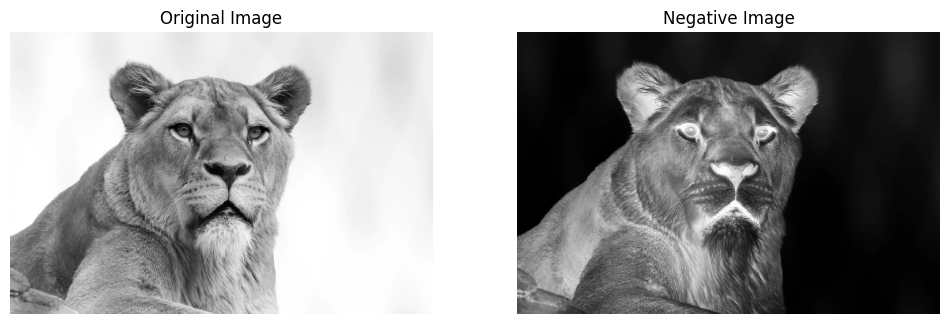

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def image_negative(image):
    return 255 - image

# Load a grayscale image
image = cv2.imread("/content/sample_data/animal-8748794_1280.webp", cv2.IMREAD_GRAYSCALE)

# Apply negative transformation
negative_image = image_negative(image)

# Display images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Negative Image')
plt.imshow(negative_image, cmap='gray')
plt.axis('off')

plt.show()


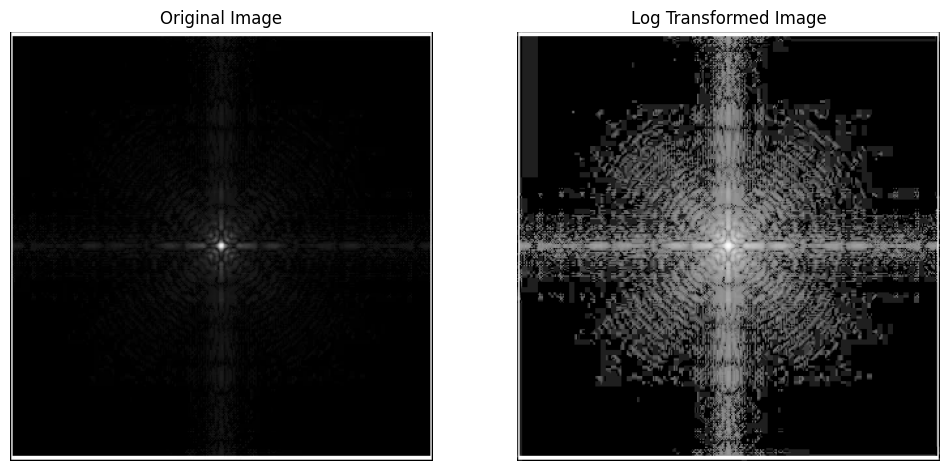

In [ ]:
def log_transformation(image, c=1.0):
    # Convert image to float32 to avoid truncation errors
    image_float = np.float32(image)
    # Apply log transformation
    log_image = c * np.log(1 + image_float)
    # Normalize to 0-255
    log_image = np.uint8(255 * (log_image - np.min(log_image)) / (np.max(log_image) - np.min(log_image)))
    return log_image

# Load a grayscale image with low gray-level values
image = cv2.imread('/content/sample_data/image_01_028-1.webp', cv2.IMREAD_GRAYSCALE)

# Apply log transformation
log_image = log_transformation(image, c=10.0)

# Display images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Log Transformed Image')
plt.imshow(log_image, cmap='gray')
plt.axis('off')

plt.show()


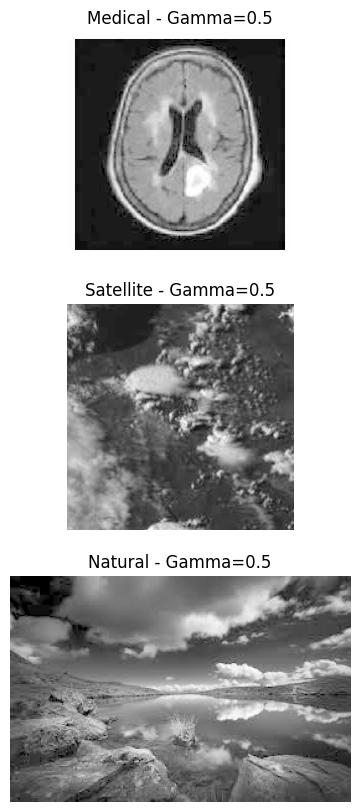

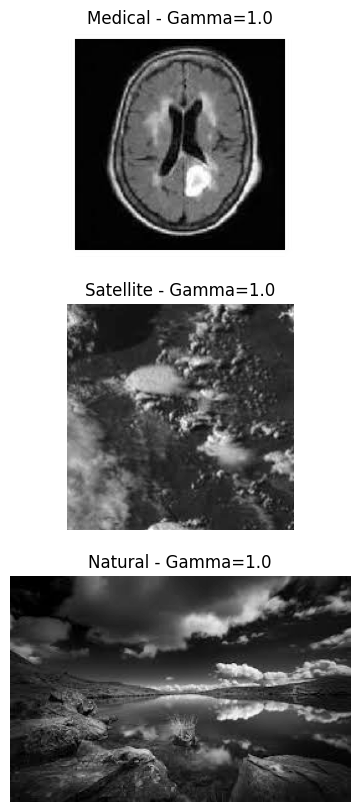

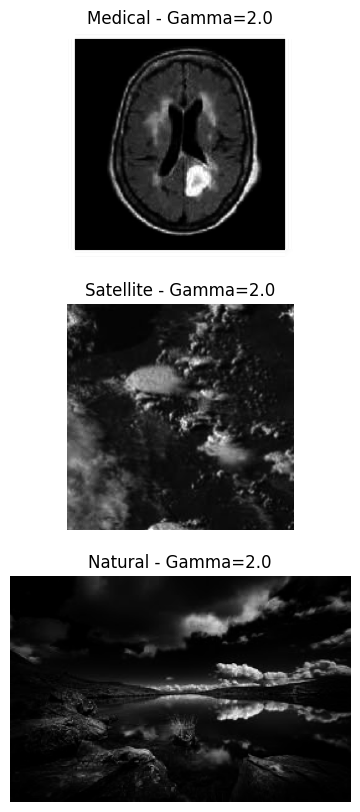

In [ ]:
def power_law_transformation(image, gamma=1.0, c=1.0):
    # Convert image to float32
    image_float = np.float32(image) / 255.0
    # Apply power-law transformation
    power_law_image = c * np.power(image_float, gamma)
    # Normalize to 0-255
    power_law_image = np.uint8(255 * power_law_image)
    return power_law_image

# Load different types of images
images = {
    'Medical': cv2.imread('/content/sample_data/download.jpeg', cv2.IMREAD_GRAYSCALE), # 'medical_image.jpg'
    'Satellite': cv2.imread('/content/sample_data/download (1).jpeg', cv2.IMREAD_GRAYSCALE), # 'satellite_image.jpg'
    'Natural': cv2.imread('/content/sample_data/download (2).jpeg', cv2.IMREAD_GRAYSCALE) # 'natural_image.jpg'
}

gammas = [0.5, 1.0, 2.0]

for gamma in gammas:
    plt.figure(figsize=(15, 10))
    for i, (title, image) in enumerate(images.items()):
        transformed_image = power_law_transformation(image, gamma)
        plt.subplot(len(images), len(gammas), i*len(gammas) + gammas.index(gamma) + 1)
        plt.title(f'{title} - Gamma={gamma}')
        plt.imshow(transformed_image, cmap='gray')
        plt.axis('off')

    plt.show()


Q1

Applying negative transformation to the grayscale image...


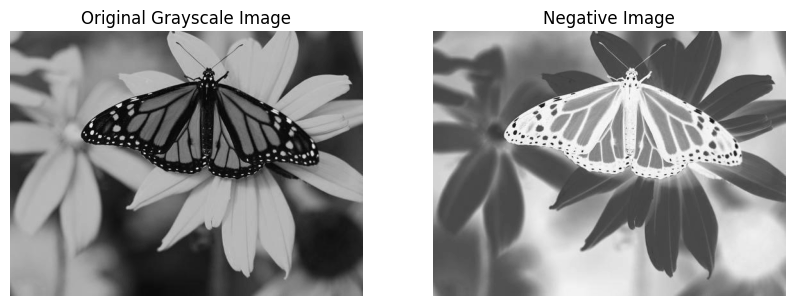

Analyzing the effect of negative transformation on contrast variants...


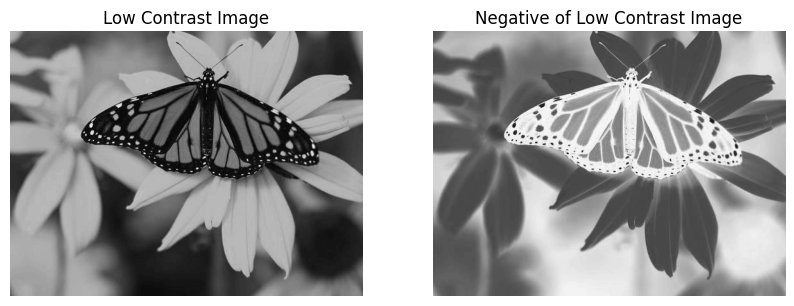

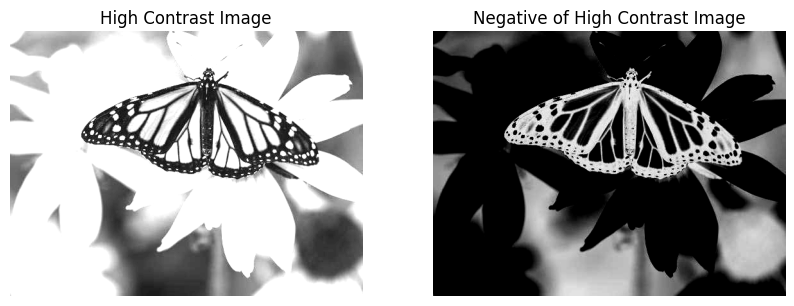

Comparing histograms of original and negative images...


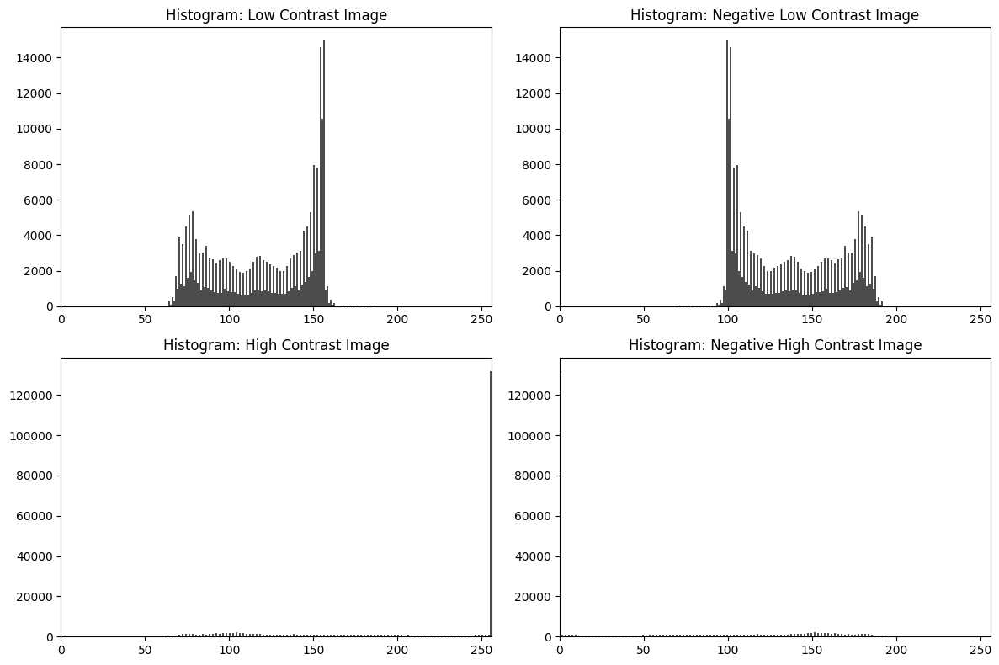

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to create a negative image
def create_image_negative(grayscale_img):
    if len(grayscale_img.shape) != 2:
        raise ValueError("Input must be a grayscale image.")
    negative_img = 255 - grayscale_img
    return negative_img

# Function to simulate a low contrast effect
def adjust_to_low_contrast(grayscale_img, alpha=0.5):
    midpoint_value = 128
    low_contrast = cv2.addWeighted(grayscale_img, alpha, np.full(grayscale_img.shape, midpoint_value, dtype=grayscale_img.dtype), 1 - alpha, 0)
    return low_contrast

# Function to enhance the image with a high contrast effect
def adjust_to_high_contrast(grayscale_img, alpha=2.0, beta=50):
    high_contrast = cv2.convertScaleAbs(grayscale_img, alpha=alpha, beta=beta)
    return high_contrast

# Function to display a histogram
def show_histogram(img, title):
    plt.hist(img.ravel(), bins=256, range=[0, 256], color='black', alpha=0.7)
    plt.title(title)
    plt.xlim([0, 256])

# Main function to demonstrate all transformations and analysis
def main():
    # Load the grayscale image
    grayscale_image = cv2.imread('/content/sample_data/grayscale.jpg', cv2.IMREAD_GRAYSCALE)
    if grayscale_image is None:
        raise FileNotFoundError("Image not found!")

    # Step 1: Image Negative Transformation
    print("Applying negative transformation to the grayscale image...")
    image_negative = create_image_negative(grayscale_image)

    plt.figure(figsize=(10, 6))
    plt.subplot(1, 2, 1)
    plt.title('Original Grayscale Image')
    plt.imshow(grayscale_image, cmap='gray')
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.title('Negative Image')
    plt.imshow(image_negative, cmap='gray')
    plt.axis('off')
    plt.show()

    # Step 2: Effect of Negative Transformation on Contrast Variants
    print("Analyzing the effect of negative transformation on contrast variants...")

    # Generate low and high contrast images
    low_contrast_image = adjust_to_low_contrast(grayscale_image)
    negative_low_contrast = create_image_negative(low_contrast_image)
    high_contrast_image = adjust_to_high_contrast(grayscale_image)
    negative_high_contrast = create_image_negative(high_contrast_image)

    # Display Low Contrast and its Negative
    plt.figure(figsize=(10, 6))
    plt.subplot(1, 2, 1)
    plt.title('Low Contrast Image')
    plt.imshow(low_contrast_image, cmap='gray')
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.title('Negative of Low Contrast Image')
    plt.imshow(negative_low_contrast, cmap='gray')
    plt.axis('off')
    plt.show()

    # Display High Contrast and its Negative
    plt.figure(figsize=(10, 6))
    plt.subplot(1, 2, 1)
    plt.title('High Contrast Image')
    plt.imshow(high_contrast_image, cmap='gray')
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.title('Negative of High Contrast Image')
    plt.imshow(negative_high_contrast, cmap='gray')
    plt.axis('off')
    plt.show()

    # Step 3: Histogram Analysis
    print("Comparing histograms of original and negative images...")
    plt.figure(figsize=(12, 8))

    # Low Contrast Histogram
    plt.subplot(2, 2, 1)
    show_histogram(low_contrast_image, 'Histogram: Low Contrast Image')
    plt.subplot(2, 2, 2)
    show_histogram(negative_low_contrast, 'Histogram: Negative Low Contrast Image')

    # High Contrast Histogram
    plt.subplot(2, 2, 3)
    show_histogram(high_contrast_image, 'Histogram: High Contrast Image')
    plt.subplot(2, 2, 4)
    show_histogram(negative_high_contrast, 'Histogram: Negative High Contrast Image')

    plt.tight_layout()
    plt.show()

# Ensure execution only when run directly
if __name__ == "__main__":
    main()


Q2

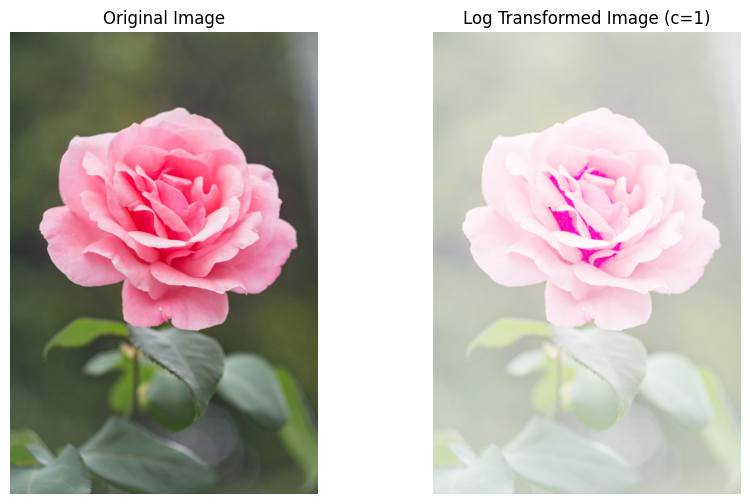

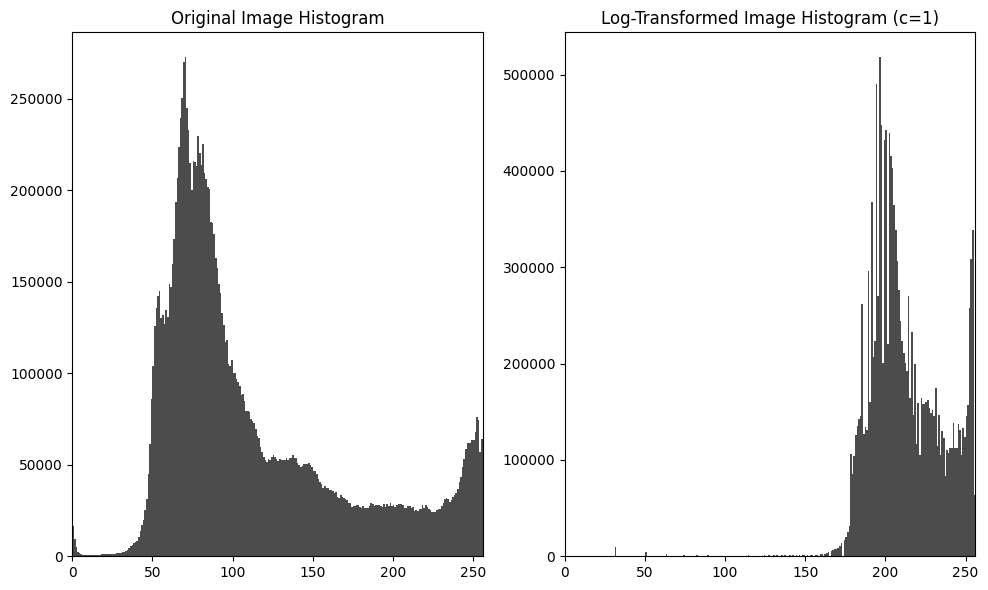

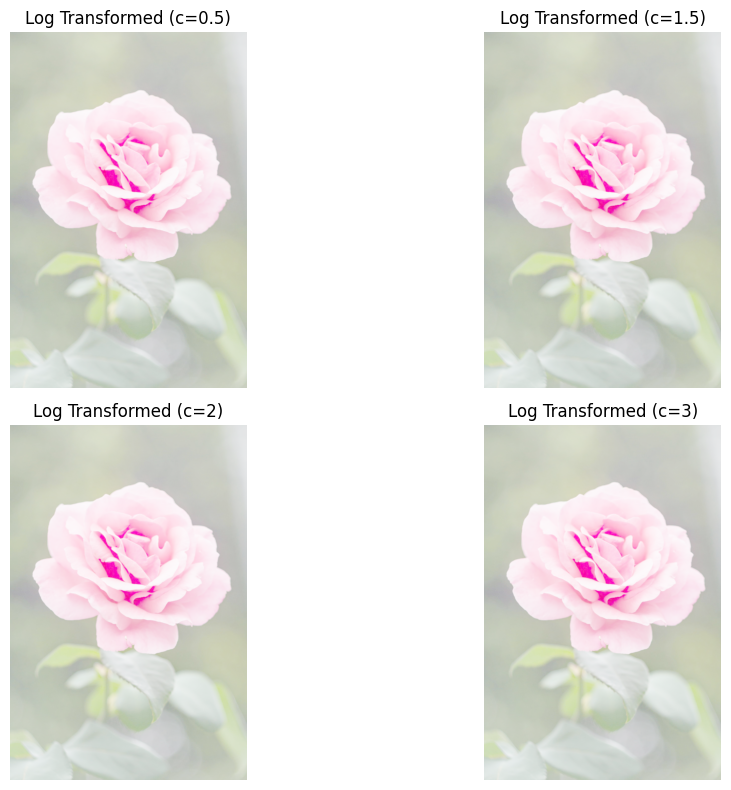

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Apply log transformation
def apply_log_transformation(image, scale_factor=1):
    # Convert image to float for calculations
    float_image = np.float32(image)
    log_transformed = scale_factor * np.log(1 + float_image)
    # Normalize and convert back to 8-bit
    return np.uint8(cv2.normalize(log_transformed, None, 0, 255, cv2.NORM_MINMAX))

# Plot histogram of an image
def display_histogram(image, title):
    plt.hist(image.ravel(), bins=256, range=[0, 256], color='black', alpha=0.7)
    plt.title(title)
    plt.xlim([0, 256])

# Main function
def main():
    # Read the image and convert to RGB
    input_image = cv2.imread('/content/sample_data/logtransfrom.jpg', cv2.IMREAD_COLOR)
    if input_image is None:
        print("Image not found. Please check the file path.")
        return
    rgb_image = cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB)

    # Log transformation with default scale factor
    log_transformed = apply_log_transformation(rgb_image, scale_factor=1)

    # Display original and log-transformed images
    plt.figure(figsize=(10, 6))
    plt.subplot(1, 2, 1)
    plt.title('Original Image')
    plt.imshow(rgb_image)
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.title('Log Transformed Image (c=1)')
    plt.imshow(log_transformed)
    plt.axis('off')
    plt.show()

    # Plot histograms
    plt.figure(figsize=(10, 6))
    plt.subplot(1, 2, 1)
    display_histogram(rgb_image, 'Original Image Histogram')
    plt.subplot(1, 2, 2)
    display_histogram(log_transformed, 'Log-Transformed Image Histogram (c=1)')
    plt.tight_layout()
    plt.show()

    # Experiment with different scale factors
    scaling_factors = [0.5, 1.5, 2, 3]
    plt.figure(figsize=(12, 8))
    for i, c in enumerate(scaling_factors):
        transformed_image = apply_log_transformation(rgb_image, scale_factor=c)
        plt.subplot(2, 2, i + 1)
        plt.title(f'Log Transformed (c={c})')
        plt.imshow(transformed_image)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()


Q3


Applying power-law transformation with different gamma values.


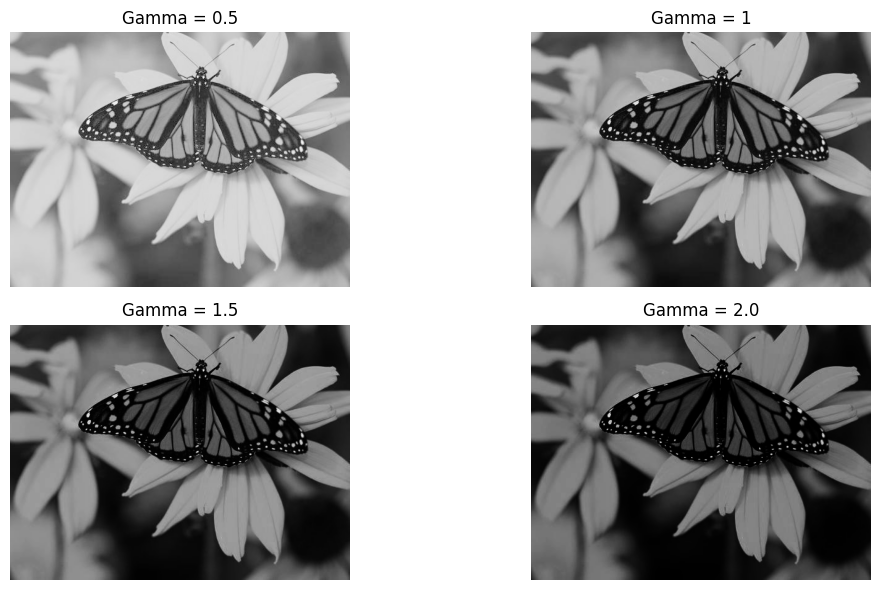


Experimenting with different image types (medical, satellite, natural).


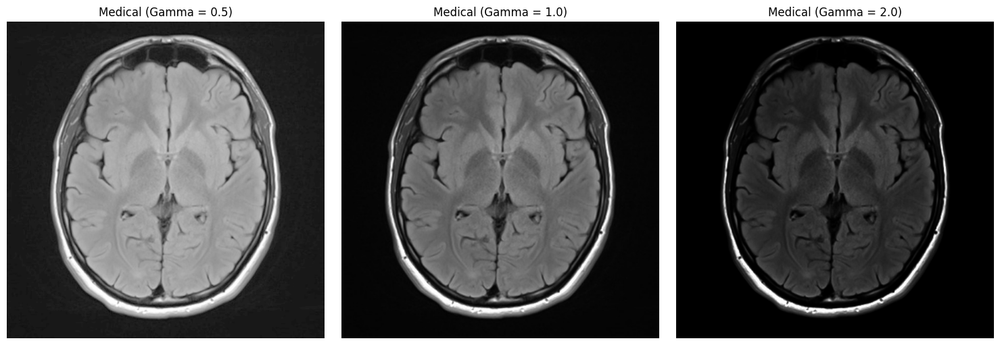

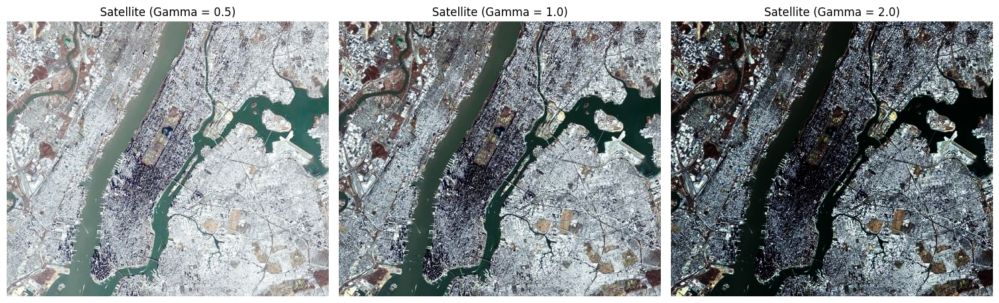

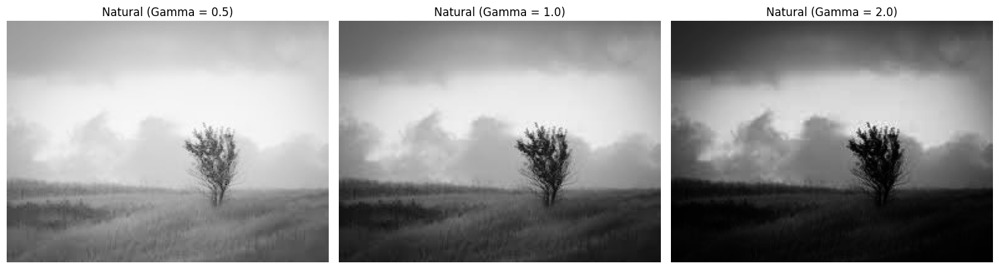

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Power-law transformation function
def power_law_transform(image, gamma=1.0, scale_factor=1.0):
    normalized_image = image / 255.0
    transformed = scale_factor * np.power(normalized_image, gamma)
    # Normalize and convert back to 8-bit
    return np.uint8(cv2.normalize(transformed, None, 0, 255, cv2.NORM_MINMAX))

# Main function
def main():
    # Question 1: Apply power-law transformation with different gamma values
    print("\nApplying power-law transformation with different gamma values.")
    input_image = cv2.imread('/content/sample_data/grayscale.jpg', cv2.IMREAD_COLOR)
    if input_image is None:
        print("Image not found. Please check the file path.")
        return
    input_image = cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB)
    gamma_values = [0.5, 1, 1.5, 2.0]

    plt.figure(figsize=(12, 6))
    for i, gamma in enumerate(gamma_values, 1):
        transformed_image = power_law_transform(input_image, gamma)
        plt.subplot(2, 2, i)
        plt.title(f'Gamma = {gamma}')
        plt.imshow(transformed_image)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

    # Question 4: Apply transformation to different image types
    print("\nExperimenting with different image types (medical, satellite, natural).")

    # Paths to the images
    images = {
        "Medical": "/content/sample_data/med.jpeg",
        "Satellite": "/content/sample_data/satellite.jpg",
        "Natural": "/content/sample_data/nature.jpeg",
    }

    gamma_values = [0.5, 1.0, 2.0]
    for image_type, path in images.items():
        image = cv2.imread(path, cv2.IMREAD_COLOR)
        if image is None:
            print(f"{image_type} image not found at {path}. Skipping.")
            continue
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(15, 5))
        for i, gamma in enumerate(gamma_values, 1):
            transformed_image = power_law_transform(image, gamma)
            plt.subplot(1, 3, i)
            plt.title(f'{image_type} (Gamma = {gamma})')
            plt.imshow(transformed_image)
            plt.axis('off')
        plt.tight_layout()
        plt.show()

if __name__ == "__main__":
    main()


Q4

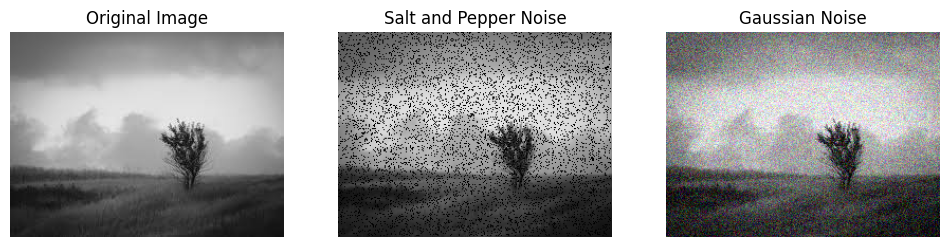

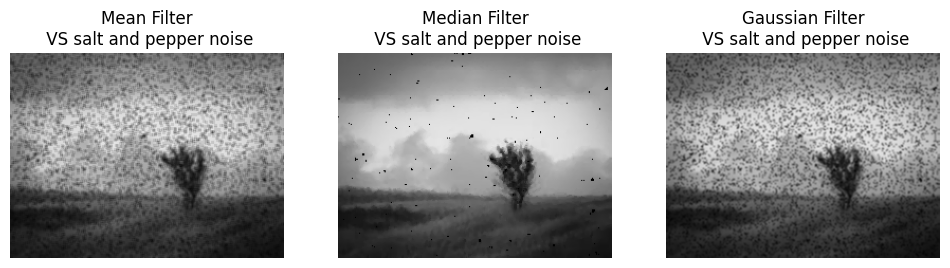

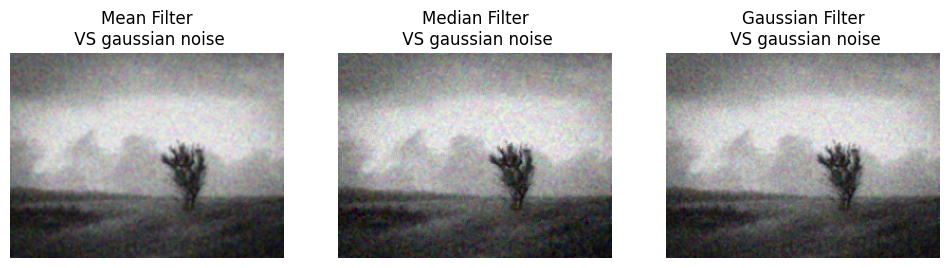

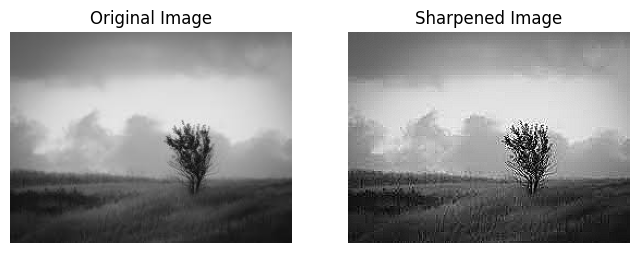

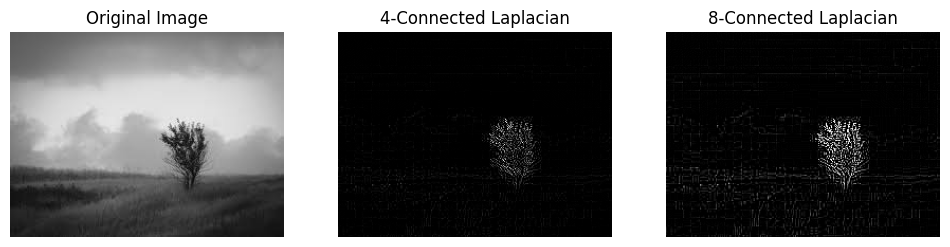

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def saltandpepper_noise(image, saltPepperRatio=0.01, amount = 0.05):
    resultant = np.copy(image)
    numSalt = np.ceil(amount * image.size * saltPepperRatio)
    coords = [np.random.randint(0, i - 1, int(numSalt)) for i in image.shape]
    resultant[coords[0], coords[1]] = 1
    numPepper = np.ceil(amount * image.size * (1.0 - saltPepperRatio))
    coords = [np.random.randint(0, i - 1, int(numPepper)) for i in image.shape]
    resultant[coords[0], coords[1]] = 0
    return resultant

def gaussian_noise(image, mean = 0, sigma = 25):
    noise = np.random.normal(mean, sigma, image.shape)
    resultant = np.clip(image + noise, 0, 255).astype(np.uint8)
    return resultant

def sharpening(image):
    kernel = np.array([[0, -1,  0],
                       [-1, 5, -1],
                       [0, -1, 0]])
    return cv2.filter2D(image, -1, kernel)

def laplacian(image , threshold = 4):
    kernel = None
    if threshold <= 4:
      kernel = np.array([[0, 1,  0],
                        [1, -4, 1],
                        [0, 1,  0]])
    else :
      kernel = np.array([[1, 1,  1],
                         [1, -8, 1],
                         [1, 1,  1]])
    return cv2.filter2D(image, -1, kernel)

# Question 1

image           = cv2.imread('/content/sample_data/nature.jpeg', cv2.IMREAD_COLOR)
image           = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
saltyImage      = saltandpepper_noise(image)
guassianImage   = gaussian_noise(image)

plt.figure(figsize=(12, 8))
plt.subplot(2, 3, 1)
plt.title('Original Image')
plt.imshow(image)
plt.axis('off')
plt.subplot(2, 3, 2)
plt.title('Salt and Pepper Noise')
plt.imshow(saltyImage)
plt.axis('off')
plt.subplot(2, 3, 3)
plt.title('Gaussian Noise')
plt.imshow(guassianImage)
plt.axis('off')
plt.show()
meanFilter      = cv2.blur(saltyImage, (3, 3))
medianFilter    = cv2.medianBlur(saltyImage, 3)
gaussianFilter  = cv2.GaussianBlur(saltyImage, (3, 3), 0)
plt.figure(figsize=(12, 8))
plt.subplot(2, 3, 1)
plt.title('Mean Filter\n VS salt and pepper noise')
plt.imshow(meanFilter)
plt.axis('off')
plt.subplot(2, 3, 2)
plt.title('Median Filter\n VS salt and pepper noise')
plt.imshow(medianFilter)
plt.axis('off')
plt.subplot(2, 3, 3)
plt.title('Gaussian Filter\n VS salt and pepper noise')
plt.imshow(gaussianFilter)
plt.axis('off')
plt.show()
meanFilter      = cv2.blur(guassianImage, (3, 3))
medianFilter    = cv2.medianBlur(guassianImage, 3)
gaussianFilter  = cv2.GaussianBlur(guassianImage, (3, 3), 0)
plt.figure(figsize=(12, 8))
plt.subplot(2, 3, 1)
plt.title('Mean Filter\n VS gaussian noise')
plt.imshow(meanFilter)
plt.axis('off')
plt.subplot(2, 3, 2)
plt.title('Median Filter\n VS gaussian noise')
plt.imshow(medianFilter)
plt.axis('off')
plt.subplot(2, 3, 3)
plt.title('Gaussian Filter\n VS gaussian noise')
plt.imshow(gaussianFilter)
plt.axis('off')
plt.show()

# Question 2

sharpenedImage  = sharpening(image)
plt.figure(figsize=(8, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image)
plt.axis('off')
plt.subplot(1, 2, 2)
plt.title('Sharpened Image')
plt.imshow(sharpenedImage)
plt.axis('off')
plt.show()

# Question 3

laplacian4 = laplacian(image , threshold = 4)
laplacian8 = laplacian(image , threshold = 8)
plt.figure(figsize=(12, 5))
plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(image)
plt.axis('off')
plt.subplot(1, 3, 2)
plt.title('4-Connected Laplacian')
plt.imshow(laplacian4)
plt.axis('off')
plt.subplot(1, 3, 3)
plt.title('8-Connected Laplacian')
plt.imshow(laplacian8)
plt.axis('off')
plt.show()

Q5

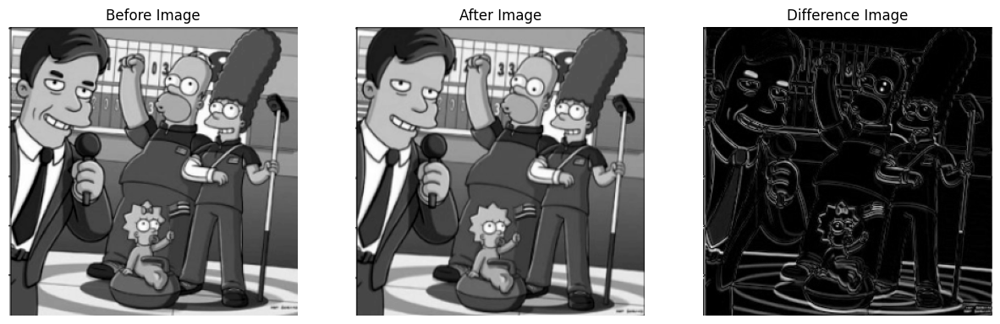

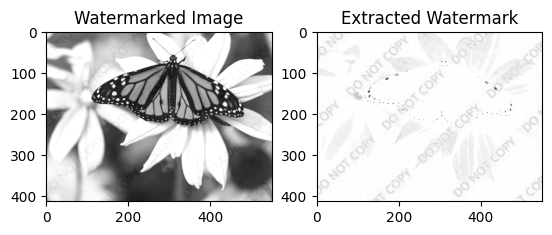

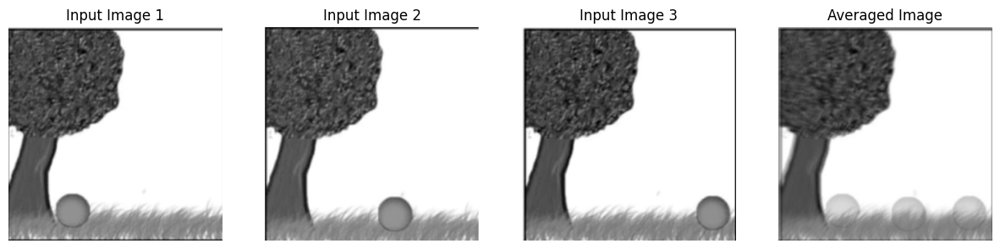

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the images
before = cv2.imread('/content/sample_data/before.png', 0)
after = cv2.imread('/content/sample_data/after.png', 0)

# Resize images to the same size (if they are not already)
if before.shape != after.shape:
    after = cv2.resize(after, (before.shape[1], before.shape[0]))

# Subtract images
difference = cv2.absdiff(before, after)

# Display the result
plt.figure(figsize=(15, 5))

# Show Before image
plt.subplot(1, 3, 1)
plt.imshow(before, cmap='gray')
plt.title('Before Image')
plt.axis('off')

# Show After image
plt.subplot(1, 3, 2)
plt.imshow(after, cmap='gray')
plt.title('After Image')
plt.axis('off')

# Show Difference image
plt.subplot(1, 3, 3)
plt.imshow(difference, cmap='gray')
plt.title('Difference Image')
plt.axis('off')

plt.show()

# Load images
image = cv2.imread('/content/sample_data/grayscale.jpg', 0)
watermark = cv2.imread('/content/watermark.jpeg', 0)

# Resize watermark to match the image size
watermark_resized = cv2.resize(watermark, (image.shape[1], image.shape[0]))

# Embed watermark into the image
watermarked_image = cv2.addWeighted(image, 1, watermark_resized, 0.3, 0)

# Extract the watermark by subtracting the original image
extracted_watermark = cv2.subtract(watermarked_image, image)

# Display results
plt.subplot(121), plt.imshow(watermarked_image, cmap='gray'), plt.title('Watermarked Image')
plt.subplot(122), plt.imshow(extracted_watermark, cmap='gray'), plt.title('Extracted Watermark')
plt.show()


image_paths = [
    '/content/in1.png',
    '/content/in2.png',
    '/content/in3.png'
]

# Load each image from the list of paths and resize them to a common size (e.g., 300x300)
common_size = (300, 300)
image_sequence = [cv2.resize(cv2.imread(path, 0), common_size) for path in image_paths]

# Compute the average of the images
average_image = np.mean(image_sequence, axis=0).astype(np.uint8)

# Display the input images and the averaged image
plt.figure(figsize=(15, 5))

# Display each input image
for i, img in enumerate(image_sequence):
    plt.subplot(1, len(image_sequence) + 1, i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f'Input Image {i+1}')
    plt.axis('off')

# Display the averaged image
plt.subplot(1, len(image_sequence) + 1, len(image_sequence) + 1)
plt.imshow(average_image, cmap='gray')
plt.title('Averaged Image')
plt.axis('off')

plt.show()


Q6

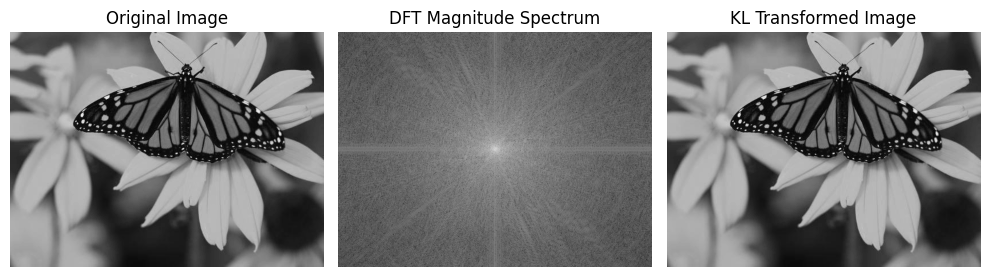

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Load the grayscale image
image = cv2.imread('/content/sample_data/grayscale.jpg', cv2.IMREAD_GRAYSCALE)

# Perform Discrete Fourier Transform
frequencyDomain = np.fft.fft2(image)
shift = np.fft.fftshift(frequencyDomain)
magnitudeSpectrum = 20 * np.log(np.abs(shift))

# Perform KL Transform (PCA-based)
flatten = image.flatten().reshape(-1, 1)
pca = PCA(n_components=1)
result = pca.fit_transform(flatten)
result = result.reshape(image.shape)

# Display the results
plt.figure(figsize=(10, 5))

# Original Image
plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.axis('off')

# DFT Magnitude Spectrum
plt.subplot(1, 3, 2)
plt.title('DFT Magnitude Spectrum')
plt.imshow(magnitudeSpectrum, cmap='gray')
plt.axis('off')

# KL Transformed Image
plt.subplot(1, 3, 3)
plt.title('KL Transformed Image')
plt.imshow(result, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


q7

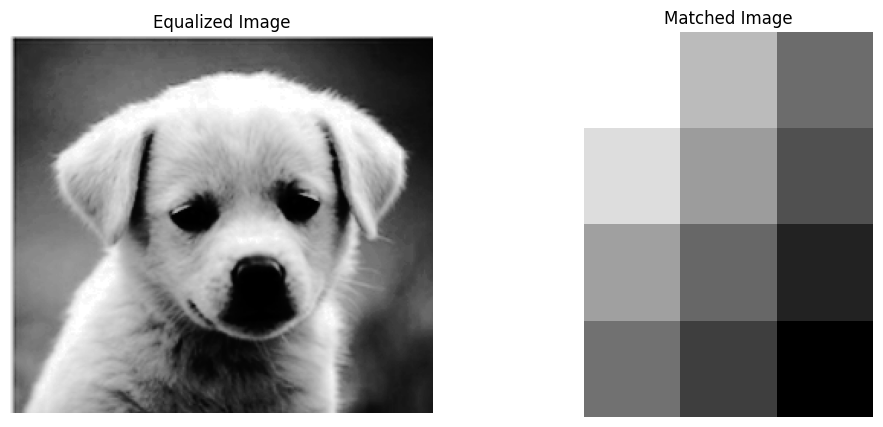

Entropy Original: 7.121421757928595
Entropy Equalized: 7.028235686161404


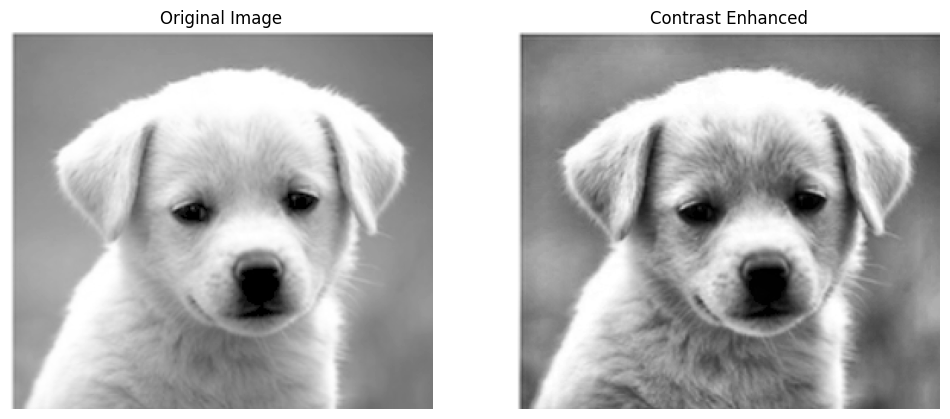

In [9]:
import cv2
import matplotlib.pyplot as plt
from skimage.measure import shannon_entropy

# Load the grayscale image
image = cv2.imread('/content/7.1.png', cv2.IMREAD_GRAYSCALE)

# Histogram Equalization
equalized_image = cv2.equalizeHist(image)

# Histogram Matching
reference_image = cv2.imread('/content/7.2.png', cv2.IMREAD_GRAYSCALE)
matched_image = cv2.matchTemplate(image, reference_image, cv2.TM_CCOEFF_NORMED)

# Entropy Calculation
entropy_original = shannon_entropy(image)
entropy_equalized = shannon_entropy(equalized_image)

# Display Equalized and Matched Images
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(matched_image, cmap='gray')
plt.title('Matched Image')
plt.axis('off')

plt.show()

print("Entropy Original:", entropy_original)
print("Entropy Equalized:", entropy_equalized)

# Contrast Enhancement using CLAHE
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
contrast_enhanced = clahe.apply(image)

# Display Original and Contrast Enhanced Images
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(contrast_enhanced, cmap='gray')
plt.title('Contrast Enhanced')
plt.axis('off')

plt.show()


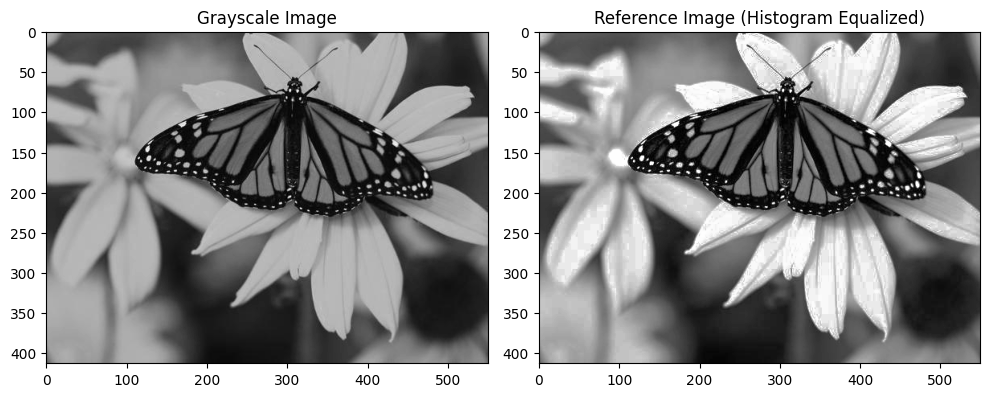

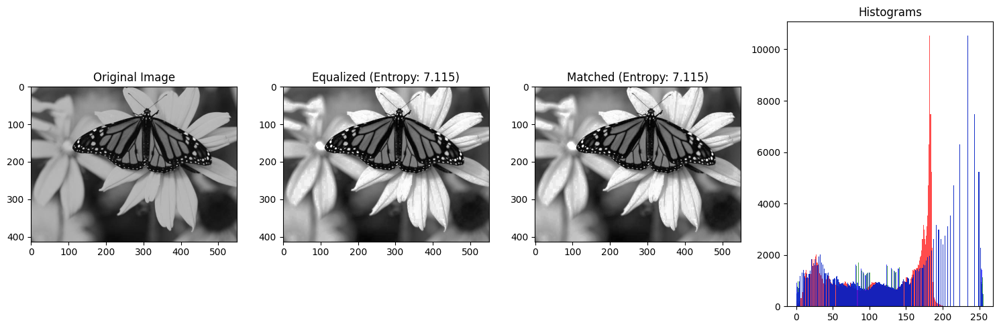

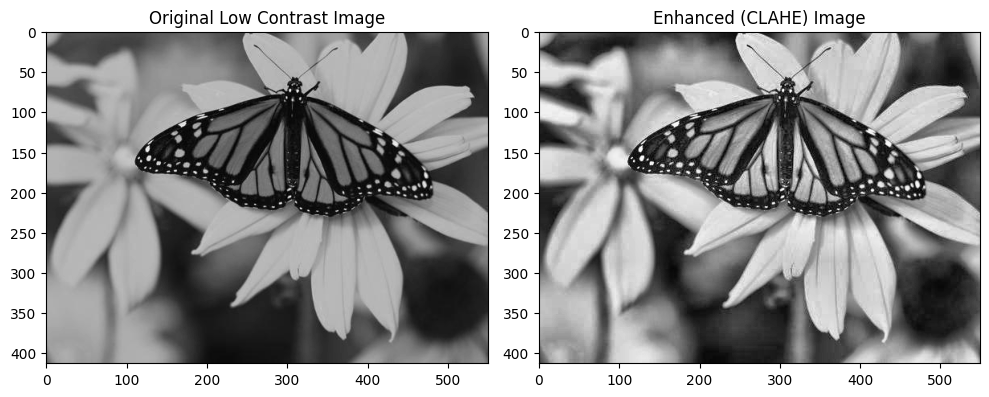

MSE: 102.034, SSIM: 0.837


In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
image_path = '/content/sample_data/grayscale.jpg'
image = cv2.imread(image_path)

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Create a reference image by applying histogram equalization
reference_image = cv2.equalizeHist(gray_image)

# Display the original grayscale image and the reference image
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(gray_image, cmap='gray')
axes[0].set_title('Grayscale Image')
axes[1].imshow(reference_image, cmap='gray')
axes[1].set_title('Reference Image (Histogram Equalized)')

plt.tight_layout()
plt.show()

# Save the reference image
cv2.imwrite('/content/reference_image.png', reference_image)

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load grayscale image
image = cv2.imread('/content/sample_data/grayscale.jpg', cv2.IMREAD_GRAYSCALE)

# Histogram Equalization
equalized_image = cv2.equalizeHist(image)

# Histogram Matching (Assume we have a reference image)
reference_image = cv2.imread('/content/reference_image.png', cv2.IMREAD_GRAYSCALE)
# Perform histogram matching using skimage or another technique
from skimage import exposure
matched_image = exposure.match_histograms(image, reference_image, channel_axis=None)

# Compute Entropy (a measure of information content)
def compute_entropy(img):
    hist, _ = np.histogram(img, bins=256, range=(0, 256))
    hist = hist / hist.sum()
    entropy = -np.sum(hist * np.log2(hist + 1e-6))  # Adding small value to avoid log(0)
    return entropy

# Entropy of the original, equalized, and matched images
entropy_original = compute_entropy(image)
entropy_equalized = compute_entropy(equalized_image)
entropy_matched = compute_entropy(matched_image)

# Displaying images and entropy values
fig, axes = plt.subplots(1, 4, figsize=(15, 5))
axes[0].imshow(image, cmap='gray')
axes[0].set_title('Original Image')
axes[1].imshow(equalized_image, cmap='gray')
axes[1].set_title(f'Equalized (Entropy: {entropy_equalized:.3f})')
axes[2].imshow(matched_image, cmap='gray')
axes[2].set_title(f'Matched (Entropy: {entropy_matched:.3f})')
axes[3].hist(image.ravel(), bins=256, range=(0, 256), color='r', alpha=0.7)
axes[3].hist(equalized_image.ravel(), bins=256, range=(0, 256), color='g', alpha=0.7)
axes[3].hist(matched_image.ravel(), bins=256, range=(0, 256), color='b', alpha=0.7)
axes[3].set_title('Histograms')

plt.tight_layout()
plt.show()

# Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
clahe_image = clahe.apply(image)

# Display original and enhanced images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(image, cmap='gray')
axes[0].set_title('Original Low Contrast Image')
axes[1].imshow(clahe_image, cmap='gray')
axes[1].set_title('Enhanced (CLAHE) Image')

plt.tight_layout()
plt.show()

from skimage.metrics import structural_similarity as ssim
mse = np.sum((image - clahe_image) ** 2) / float(image.shape[0] * image.shape[1])
ssim_value = ssim(image, clahe_image)

print(f'MSE: {mse:.3f}, SSIM: {ssim_value:.3f}')

q8

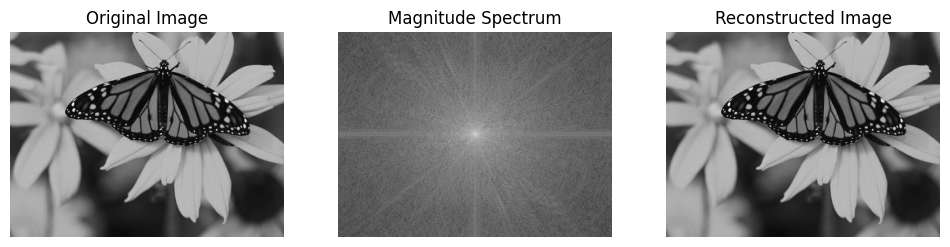

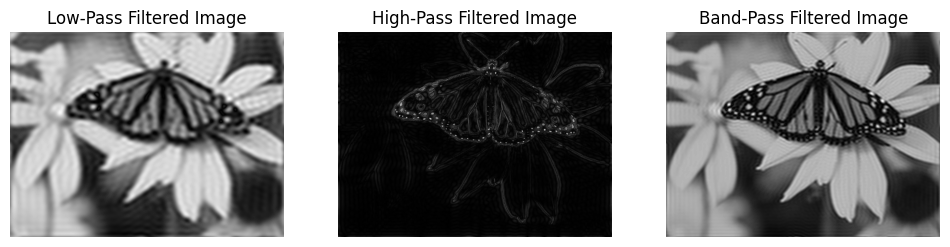

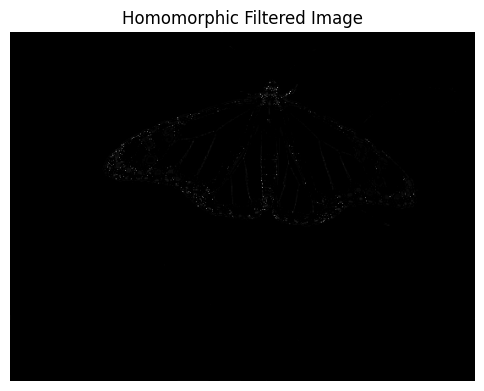

In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Low-Pass Filter
def low_pass(image, radius):
    rows, cols = image.shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols), np.uint8)
    mask[crow-radius:crow+radius, ccol-radius:ccol+radius] = 1
    dft = np.fft.fft2(image)
    dft = np.fft.fftshift(dft)
    dft = dft * mask
    idft = np.fft.ifftshift(dft)
    idft = np.fft.ifft2(idft)
    idft = np.abs(idft)
    return idft

# High-Pass Filter
def high_pass(image, radius):
    rows, cols = image.shape
    crow, ccol = rows // 2, cols // 2
    mask = np.ones((rows, cols), np.uint8)
    mask[crow-radius:crow+radius, ccol-radius:ccol+radius] = 0
    dft = np.fft.fft2(image)
    dft = np.fft.fftshift(dft)
    dft = dft * mask
    idft = np.fft.ifftshift(dft)
    idft = np.fft.ifft2(idft)
    idft = np.abs(idft)
    return idft

# Band-Pass Filter
def band_pass(image, low, high):
    rows, cols = image.shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols), np.uint8)
    mask[crow-high:crow+high, ccol-high:ccol+high] = 1
    mask[crow-low:crow+low, ccol-low:crow+low] = 0
    dft = np.fft.fft2(image)
    dft = np.fft.fftshift(dft)
    dft = dft * mask
    idft = np.fft.ifftshift(dft)
    idft = np.fft.ifft2(idft)
    idft = np.abs(idft)
    return idft

# Homomorphic Filtering
def homomorphic(image, low_gamma=0.5, high_gamma=2.0):
    image_log = np.log1p(np.array(image, dtype="float32"))
    dft = np.fft.fft2(image_log)
    dft = np.fft.fftshift(dft)
    rows, cols = image.shape
    crow, ccol = rows // 2, cols // 2
    D0 = 30  # Cutoff frequency
    H = np.zeros((rows, cols))
    for u in range(rows):
        for v in range(cols):
            D = np.sqrt((u - crow)**2 + (v - ccol)**2)
            H[u, v] = 1 - np.exp(-(D**2) / (2 * (D0**2)))
    dft = dft * H
    idft = np.fft.ifftshift(dft)
    idft = np.fft.ifft2(idft)
    filter_log = np.abs(idft)
    filtered = np.expm1(filter_log)
    filtered = np.clip(filtered, 0, 255)
    filtered = np.uint8(filtered)
    return filtered

# Question 1: 2D DFT and its Inverse
image = cv2.imread('/content/sample_data/grayscale.jpg', cv2.IMREAD_GRAYSCALE)
dft = np.fft.fft2(image)
shift = np.fft.fftshift(dft)
magnitude_spectrum = 20 * np.log(np.abs(shift))
idft = np.fft.ifftshift(shift)  # Shift back
idft = np.fft.ifft2(idft)
reconstruction = np.abs(idft)

# Display
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Magnitude Spectrum')
plt.imshow(magnitude_spectrum, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Reconstructed Image')
plt.imshow(reconstruction, cmap='gray')
plt.axis('off')

plt.show()

# Question 2: Frequency Domain Filters
low_pass_image = low_pass(image, radius=30)
high_pass_image = high_pass(image, radius=30)
band_pass_image = band_pass(image, low=20, high=60)

# Display
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.title('Low-Pass Filtered Image')
plt.imshow(low_pass_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('High-Pass Filtered Image')
plt.imshow(high_pass_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Band-Pass Filtered Image')
plt.imshow(band_pass_image, cmap='gray')
plt.axis('off')

plt.show()

# Question 3: Homomorphic Filtering
result = homomorphic(image)

# Display
plt.figure(figsize=(6, 6))
plt.title('Homomorphic Filtered Image')
plt.imshow(result, cmap='gray')
plt.axis('off')

plt.show()


q9

Implement color space conversions between RGB, HSI, and YCbCr color models.


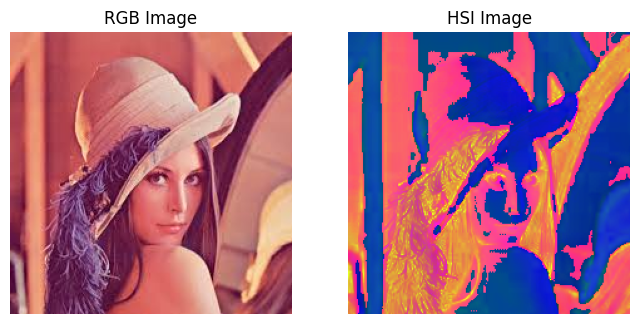

Perform color histogram equalization on a color image and analyze the results.


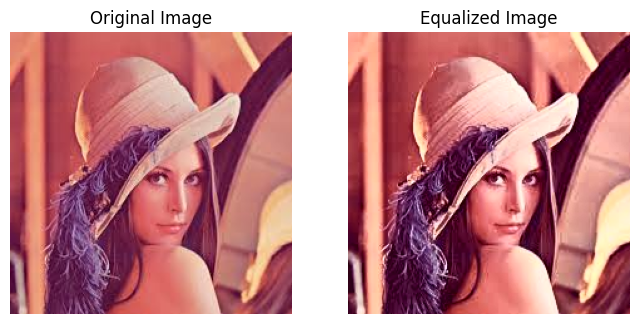

Implement color edge detection using Sobel or Canny operators.


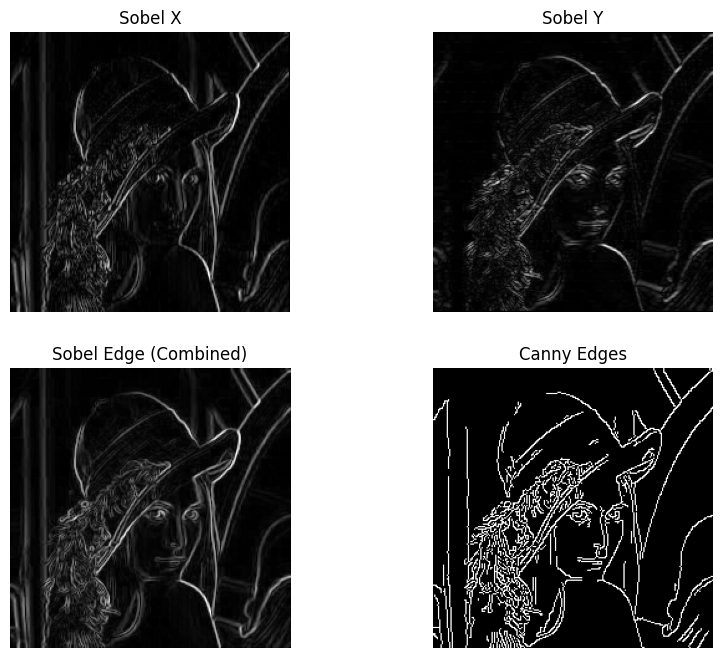

In [16]:
def rgb_to_hsi(image):
    with np.errstate(divide='ignore', invalid='ignore'):
        R = image[:, :, 0] / 255.0
        G = image[:, :, 1] / 255.0
        B = image[:, :, 2] / 255.0
        I = (R + G + B) / 3.0
        minRGB = np.minimum(np.minimum(R, G), B)
        S = 1 - (3 / (R + G + B + 1e-10)) * minRGB
        num = 0.5 * ((R - G) + (R - B))
        denom = np.sqrt((R - G)**2 + (R - B)*(G - B)) + 1e-10
        theta = np.arccos(num / denom)
        H = np.zeros_like(R)
        H[B <= G] = theta[B <= G]
        H[B > G] = (2 * np.pi) - theta[B > G]
        H = H / (2 * np.pi)
        HSI = np.stack((H, S, I), axis=2)
        return HSI

print("Implement color space conversions between RGB, HSI, and YCbCr color models.")

image = cv2.imread('/content/sample_data/download.jpeg', cv2.IMREAD_COLOR)
rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
hsi = rgb_to_hsi(rgb)

# Display RGB and HSI images
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.title('RGB Image')
plt.imshow(rgb)
plt.axis('off')
plt.subplot(1, 2, 2)
plt.title('HSI Image')
plt.imshow(hsi)
plt.axis('off')
plt.show()

print("Perform color histogram equalization on a color image and analyze the results.")

ycbcr = cv2.cvtColor(rgb, cv2.COLOR_RGB2YCrCb)
ycbcr[:, :, 0] = cv2.equalizeHist(ycbcr[:, :, 0])  # Equalizing the luminance channel
equalized = cv2.cvtColor(ycbcr, cv2.COLOR_YCrCb2RGB)

# Display original and equalized images
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(rgb)
plt.axis('off')
plt.subplot(1, 2, 2)
plt.title('Equalized Image')
plt.imshow(equalized)
plt.axis('off')
plt.show()

print("Implement color edge detection using Sobel or Canny operators.")

# Convert to grayscale
gray = cv2.cvtColor(rgb, cv2.COLOR_RGB2GRAY)

# Apply Sobel edge detection
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
sobelEdge = np.sqrt(sobelx**2 + sobely**2)

# Apply Canny edge detection
cannyEdge = cv2.Canny(gray, 100, 200)

# Display the results
plt.figure(figsize=(10, 8))
plt.subplot(2, 2, 1)
plt.title('Sobel X')
plt.imshow(np.abs(sobelx), cmap='gray')
plt.axis('off')
plt.subplot(2, 2, 2)
plt.title('Sobel Y')
plt.imshow(np.abs(sobely), cmap='gray')
plt.axis('off')
plt.subplot(2, 2, 3)
plt.title('Sobel Edge (Combined)')
plt.imshow(np.abs(sobelEdge), cmap='gray')
plt.axis('off')
plt.subplot(2, 2, 4)
plt.title('Canny Edges')
plt.imshow(cannyEdge, cmap='gray')
plt.axis('off')
plt.show()


q10

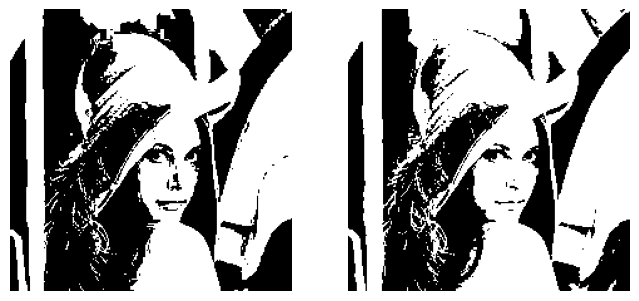

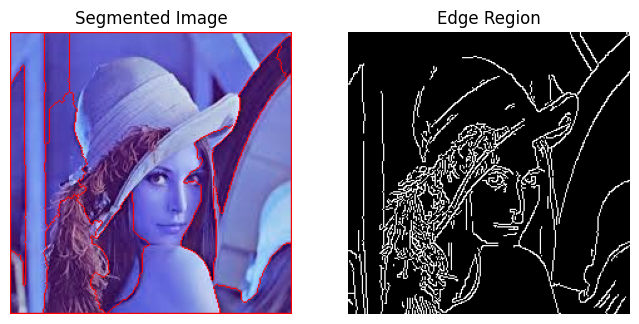

In [20]:
image = cv2.imread('/content/sample_data/download.jpeg', cv2.IMREAD_GRAYSCALE)
_, thresh = cv2.threshold(image, 128, 255, cv2.THRESH_BINARY)
otsuThreshold, otsuImage = cv2.threshold(image, 0, 255,
cv2.THRESH_BINARY + cv2.THRESH_OTSU)
plt.figure(figsize=(8, 5))
plt.subplot(1, 2, 1)
plt.imshow(thresh, cmap='gray')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(otsuImage, cmap='gray')
plt.axis('off')
plt.show()
rgb       = cv2.imread('/content/sample_data/download.jpeg', cv2.IMREAD_COLOR)
image     = cv2.cvtColor(rgb , cv2.COLOR_BGR2GRAY)
_, binary = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY_INV +
cv2.THRESH_OTSU)
kernel = np.ones((3,3), np.uint8)
sureBG = cv2.dilate(binary, kernel, iterations=3)
distTransform = cv2.distanceTransform(binary, cv2.DIST_L2, 5)
_, sureFG = cv2.threshold(distTransform, 0.7*distTransform.max(), 255, 0)
sureFG = sureFG.astype(np.uint8)
unknown = cv2.subtract(sureBG, sureFG)
markers = cv2.connectedComponents(sureFG.astype(np.uint8))[1]
markers = markers + 1
markers[unknown == 255] = 0
cv2.watershed(rgb, markers)
rgb[markers == -1] = [255, 0, 0]
plt.figure(figsize=(8, 5))
plt.subplot(1, 2, 1)
plt.title('Segmented Image')
plt.imshow(rgb)
plt.axis('off')
plt.subplot(1, 2, 2)
plt.title('Edge Region')
edges = cv2.Canny(image, 100, 200)
plt.imshow(edges, cmap='gray')
plt.axis('off')
plt.show()

Q11

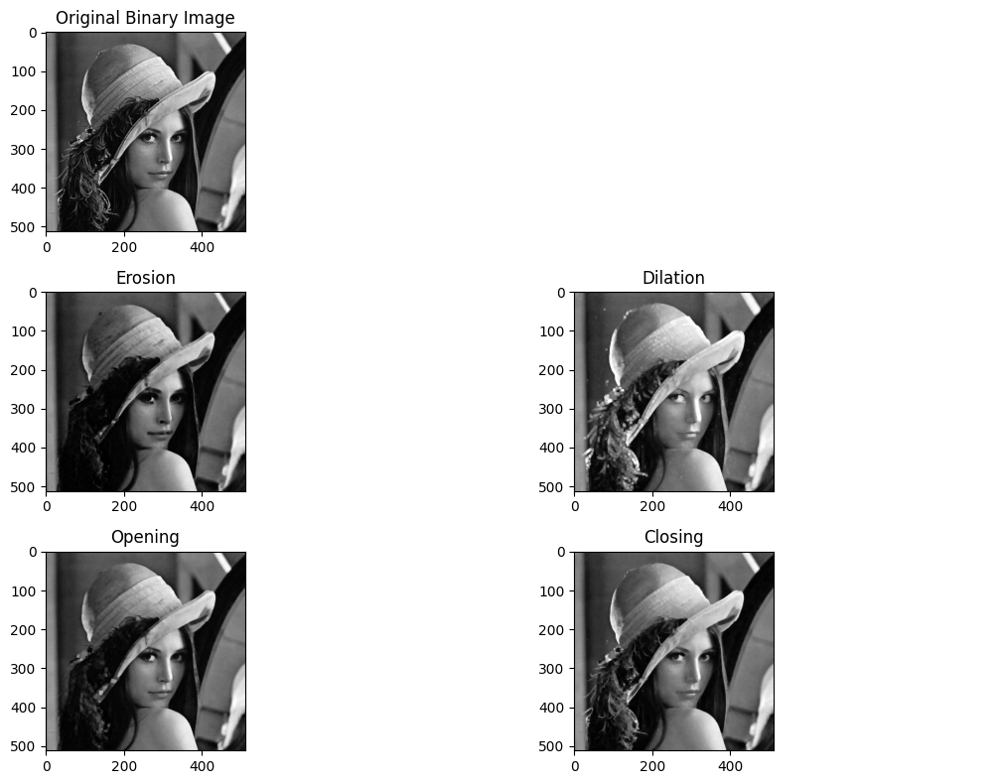

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the binary image
image = cv2.imread('/content/sample_data/lenabw.png', cv2.IMREAD_GRAYSCALE)

# Define the kernel for morphological operations
kernel = np.ones((5, 5), np.uint8)

# --- 1. Erosion ---
def perform_erosion(image, kernel):
    eroded = cv2.erode(image, kernel, iterations=1)
    return eroded

eroded_image = perform_erosion(image, kernel)

# --- 2. Dilation ---
def perform_dilation(image, kernel):
    dilated = cv2.dilate(image, kernel, iterations=1)
    return dilated

dilated_image = perform_dilation(image, kernel)

# --- 3. Opening ---
def perform_opening(image, kernel):
    opened = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)
    return opened

opened_image = perform_opening(image, kernel)

# --- 4. Closing ---
def perform_closing(image, kernel):
    closed = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    return closed

closed_image = perform_closing(image, kernel)

# --- Display Results ---
plt.figure(figsize=(12, 8))

# Original Binary Image
plt.subplot(3, 2, 1)
plt.title("Original Binary Image")
plt.imshow(image, cmap='gray')

plt.subplot(3, 2, 2)
plt.axis('off')

# Erosion
plt.subplot(3, 2, 3)
plt.title("Erosion")
plt.imshow(eroded_image, cmap='gray')

# Dilation
plt.subplot(3, 2, 4)
plt.title("Dilation")
plt.imshow(dilated_image, cmap='gray')

# Opening
plt.subplot(3, 2, 5)
plt.title("Opening")
plt.imshow(opened_image, cmap='gray')

# Closing
plt.subplot(3, 2, 6)
plt.title("Closing")
plt.imshow(closed_image, cmap='gray')


plt.tight_layout()
plt.show()


Q12

In [2]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def register_images(image1, image2):
    # Convert images to grayscale
    gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

    # Initialize ORB detector
    orb = cv2.ORB_create()

    # Find the keypoints and descriptors with ORB
    kp1, des1 = orb.detectAndCompute(gray1, None)
    kp2, des2 = orb.detectAndCompute(gray2, None)

    # Use FLANN (Fast Library for Approximate Nearest Neighbors) for matching descriptors
    index_params = dict(algorithm=6, table_number=6, key_size=12, multi_probe_level=1)
    search_params = dict(checks=50)  # Higher number of checks will improve results but slower
    flann = cv2.FlannBasedMatcher(index_params, search_params)

    # Match descriptors
    matches = flann.knnMatch(des1, des2, k=2)

    # Apply ratio test to keep good matches
    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)

    # Draw matches
    img_matches = cv2.drawMatches(image1, kp1, image2, kp2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    # Show matches
    plt.figure(figsize=(10, 6))
    plt.imshow(img_matches)
    plt.title("ORB Feature Matching")
    plt.show()

    # Find the homography matrix
    if len(good_matches) > 4:  # At least 4 matches are needed to compute homography
        src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

        # Compute the homography matrix using RANSAC
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

        # Warp the first image to align with the second image
        h, w = gray2.shape
        aligned_image = cv2.warpPerspective(image1, M, (w, h))

        return aligned_image, M
    else:
        print("Not enough matches found!")
        return None, None

# Example usage
image1 = cv2.imread('/content/sample_data/input1.jpg')  # Path to the first image
image2 = cv2.imread('/content/sample_data/input2.jpg')  # Path to the second image

aligned_image, homography_matrix = register_images(image1, image2)

if aligned_image is not None:
    # Show the aligned image
    plt.figure(figsize=(10, 6))
    plt.imshow(cv2.cvtColor(aligned_image, cv2.COLOR_BGR2RGB))
    plt.title("Aligned Image")
    plt.show()


ValueError: not enough values to unpack (expected 2, got 0)

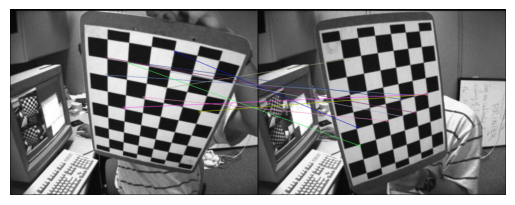

In [3]:
import cv2
import matplotlib.pyplot as plt

# Read the images
image1 = cv2.imread('/content/sample_data/input1.jpg', cv2.IMREAD_COLOR)
image2 = cv2.imread('/content/sample_data/input2.jpg', cv2.IMREAD_COLOR)

# Create an ORB detector
orb = cv2.ORB_create()

# Detect keypoints and compute descriptors for both images
kp1, des1 = orb.detectAndCompute(image1, None)
kp2, des2 = orb.detectAndCompute(image2, None)

# Create a Brute-Force Matcher with Hamming distance
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Match descriptors between the two images
matches = bf.match(des1, des2)

# Sort matches based on their distances (best matches first)
matches = sorted(matches, key=lambda x: x.distance)

# Draw the top 10 matches
image3 = cv2.drawMatches(image1, kp1, image2, kp2, matches[:10], None, flags=2)

# Convert BGR to RGB for displaying with Matplotlib
image3 = cv2.cvtColor(image3, cv2.COLOR_BGR2RGB)

# Display the matched image
plt.imshow(image3)
plt.axis('off')
plt.show()
